In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Femur.stl to Femur.stl


In [ ]:
!ls


Femur.stl  sample_data


In [ ]:
!pip install trimesh scikit-image opencv-python matplotlib scipy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 736.6/736.6 kB 30.1 MB/s eta 0:00:00


In [ ]:
import trimesh

# Load STL
mesh = trimesh.load("Femur.stl")

print("Femur loaded successfully!")
print("Number of vertices:", len(mesh.vertices))
print("Number of faces:", len(mesh.faces))


Femur loaded successfully!
Number of vertices: 1735789
Number of faces: 3471810


New voxel volume shape: (142, 43, 204)


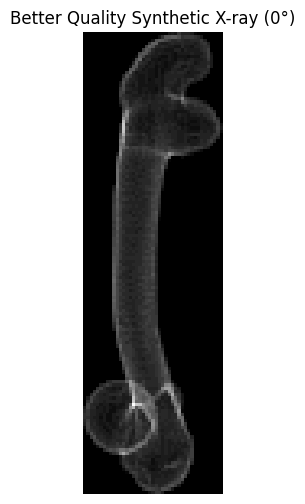

In [ ]:
import numpy as np
import trimesh
import matplotlib.pyplot as plt
import cv2

# Load femur STL
mesh = trimesh.load("Femur.stl")

# --------- HIGHER RESOLUTION VOXELIZATION ---------
# Smaller voxel_size = better quality (more memory)
voxel_size = mesh.scale / 250   # Try 200–350 for sharper X-ray

vox = mesh.voxelized(voxel_size)
vol = vox.matrix.astype(np.uint8)

print("New voxel volume shape:", vol.shape)

# --------- SYNTHETIC X-RAY (0°) ----------
xray_0deg = np.sum(vol, axis=2)

if xray_0deg.max() != 0:
    xray_0deg = xray_0deg / xray_0deg.max()

cv2.imwrite("xray_0deg.png", (xray_0deg * 255).astype(np.uint8))

plt.figure(figsize=(6,6))
plt.imshow(xray_0deg, cmap="gray")
plt.title("Better Quality Synthetic X-ray (0°)")
plt.axis("off")
plt.show()


Voxel volume shape: (142, 43, 204)


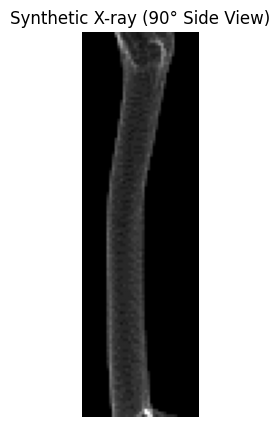

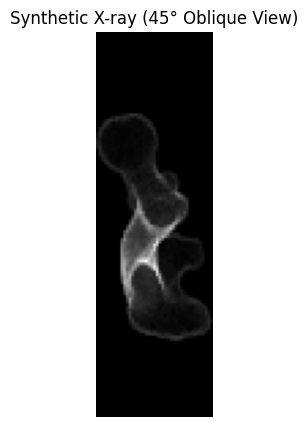

In [ ]:
import numpy as np
import trimesh
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import rotate

# Load femur STL
mesh = trimesh.load("Femur.stl")

# High-resolution voxelization (same as before)
voxel_size = mesh.scale / 250
vox = mesh.voxelized(voxel_size)
vol = vox.matrix.astype(np.uint8)

print("Voxel volume shape:", vol.shape)

# -----------------------------
# 1️⃣ 90° SIDE VIEW X-RAY
# -----------------------------
vol_90 = rotate(vol, 90, axes=(0,2), reshape=False, order=1)

xray_90deg = np.sum(vol_90, axis=2)
xray_90deg = xray_90deg / xray_90deg.max()

cv2.imwrite("xray_90deg.png", (xray_90deg * 255).astype(np.uint8))

plt.figure(figsize=(5,5))
plt.imshow(xray_90deg, cmap="gray")
plt.title("Synthetic X-ray (90° Side View)")
plt.axis("off")
plt.show()

# -----------------------------
# 2️⃣ 45° OBLIQUE VIEW X-RAY
# -----------------------------
vol_45 = rotate(vol, 45, axes=(0,2), reshape=False, order=1)

xray_45deg = np.sum(vol_45, axis=2)
xray_45deg = xray_45deg / xray_45deg.max()

cv2.imwrite("xray_45deg.png", (xray_45deg * 255).astype(np.uint8))

plt.figure(figsize=(5,5))
plt.imshow(xray_45deg, cmap="gray")
plt.title("Synthetic X-ray (45° Oblique View)")
plt.axis("off")
plt.show()


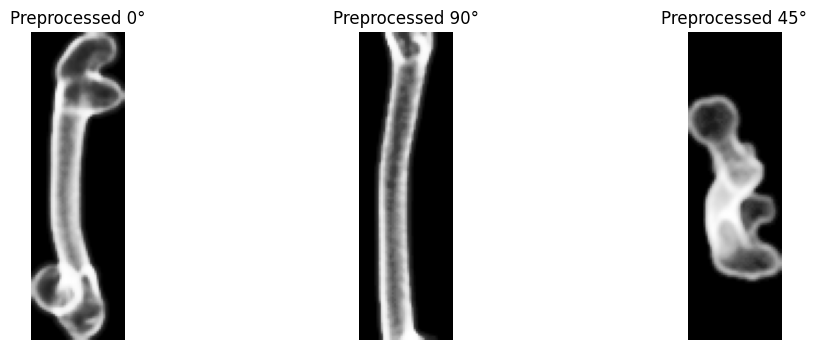

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load X-ray images
xray_0 = cv2.imread("xray_0deg.png", cv2.IMREAD_GRAYSCALE)
xray_90 = cv2.imread("xray_90deg.png", cv2.IMREAD_GRAYSCALE)
xray_45 = cv2.imread("xray_45deg.png", cv2.IMREAD_GRAYSCALE)

# Preprocessing function
def preprocess(img):
    img_blur = cv2.GaussianBlur(img, (5,5), 0)
    img_eq = cv2.equalizeHist(img_blur)
    return img_eq

# Apply preprocessing
xray_0_p = preprocess(xray_0)
xray_90_p = preprocess(xray_90)
xray_45_p = preprocess(xray_45)

# Display results
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(xray_0_p, cmap='gray')
plt.title("Preprocessed 0°")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(xray_90_p, cmap='gray')
plt.title("Preprocessed 90°")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(xray_45_p, cmap='gray')
plt.title("Preprocessed 45°")
plt.axis("off")

plt.show()


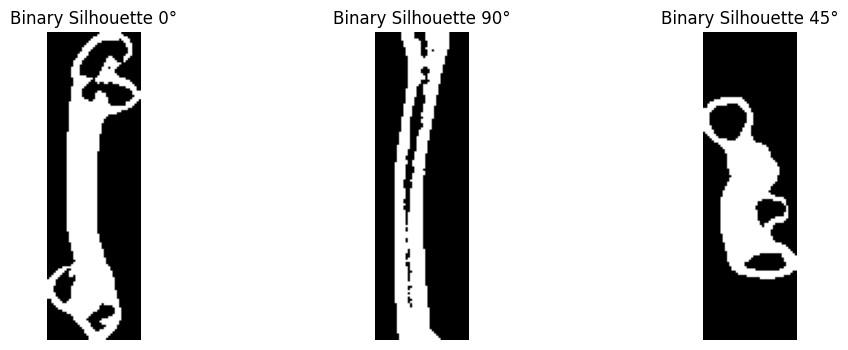

In [ ]:
# Otsu Thresholding for silhouette extraction
_, mask_0 = cv2.threshold(xray_0_p, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
_, mask_90 = cv2.threshold(xray_90_p, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
_, mask_45 = cv2.threshold(xray_45_p, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display binary masks
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(mask_0, cmap='gray')
plt.title("Binary Silhouette 0°")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mask_90, cmap='gray')
plt.title("Binary Silhouette 90°")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(mask_45, cmap='gray')
plt.title("Binary Silhouette 45°")
plt.axis("off")

plt.show()


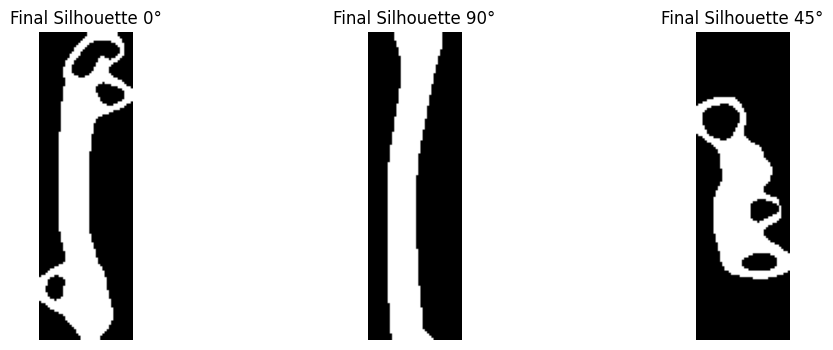

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))

mask_0_c = cv2.morphologyEx(mask_0, cv2.MORPH_CLOSE, kernel)
mask_90_c = cv2.morphologyEx(mask_90, cv2.MORPH_CLOSE, kernel)
mask_45_c = cv2.morphologyEx(mask_45, cv2.MORPH_CLOSE, kernel)

# Save final silhouettes
cv2.imwrite("silhouette_0deg.png", mask_0_c)
cv2.imwrite("silhouette_90deg.png", mask_90_c)
cv2.imwrite("silhouette_45deg.png", mask_45_c)

# Display cleaned silhouettes
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(mask_0_c, cmap='gray')
plt.title("Final Silhouette 0°")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(mask_90_c, cmap='gray')
plt.title("Final Silhouette 90°")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(mask_45_c, cmap='gray')
plt.title("Final Silhouette 45°")
plt.axis("off")

plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import measure

# Load silhouettes
sil0 = cv2.imread("silhouette_0deg.png", cv2.IMREAD_GRAYSCALE)
sil90 = cv2.imread("silhouette_90deg.png", cv2.IMREAD_GRAYSCALE)
sil45 = cv2.imread("silhouette_45deg.png", cv2.IMREAD_GRAYSCALE)

# Convert to binary (0 or 1)
sil0 = (sil0 > 0).astype(np.uint8)
sil90 = (sil90 > 0).astype(np.uint8)
sil45 = (sil45 > 0).astype(np.uint8)

h, w = sil0.shape
vol_size = 200   # 3D grid resolution (increase later for better quality)

# Create empty 3D volume
visual_hull = np.ones((vol_size, vol_size, vol_size), dtype=np.uint8)

# Create coordinate grid
xs = np.linspace(0, w-1, vol_size).astype(int)
ys = np.linspace(0, h-1, vol_size).astype(int)

# -------------------------------
# Back-projection from 0° view
# -------------------------------
for i, y in enumerate(ys):
    for j, x in enumerate(xs):
        if sil0[y, x] == 0:
            visual_hull[i, j, :] = 0

# -------------------------------
# Back-projection from 90° view
# -------------------------------
for i, y in enumerate(ys):
    for k, x in enumerate(xs):
        if sil90[y, x] == 0:
            visual_hull[i, :, k] = 0

# -------------------------------
# Back-projection from 45° view
# (approximate oblique constraint)
# -------------------------------
for i, y in enumerate(ys):
    for j, x in enumerate(xs):
        if sil45[y, x] == 0:
            visual_hull[i, j, j] = 0

print("Visual hull volume created:", visual_hull.shape)

# -------------------------------
# 3D Surface Extraction
# -------------------------------
verts, faces, _, _ = measure.marching_cubes(visual_hull, level=0.5)

# -------------------------------
# Display 3D Reconstruction
# -------------------------------
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
mesh = Poly3DCollection(verts[faces], alpha=0.7)
ax.add_collection3d(mesh)

ax.set_xlim(0, vol_size)
ax.set_ylim(0, vol_size)
ax.set_zlim(0, vol_size)

ax.set_title("Reconstructed 3D Femur (Visual Hull)")
plt.show()


Visual hull volume created: (200, 200, 200)


In [ ]:
import plotly.graph_objects as go
import numpy as np

# verts and faces must already exist from marching cubes
x, y, z = verts.T
i, j, k = faces.T

fig = go.Figure(
    data=[
        go.Mesh3d(
            x=x, y=y, z=z,
            i=i, j=j, k=k,
            opacity=0.7,
            color='lightblue'
        )
    ]
)

fig.update_layout(
    title="Interactive 3D Reconstructed Femur (Rotate Freely)",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    width=700,
    height=700
)

fig.show()


In [ ]:
voxel_volume = np.sum(visual_hull)
print("Approximate 3D Femur Volume (in voxels):", voxel_volume)


Approximate 3D Femur Volume (in voxels): 1102623


In [ ]:
!pip install scikit-image


In [ ]:
import numpy as np
import trimesh
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import rotate
import os

# Load femur STL
mesh = trimesh.load("Femur.stl")

# Voxelize at good resolution
voxel_size = mesh.scale / 200
vox = mesh.voxelized(voxel_size)
vol = vox.matrix.astype(np.uint8)

print("Voxel volume shape:", vol.shape)

# Create folder for CT projections
os.makedirs("ct_projections", exist_ok=True)

# Generate 180 projections (0° to 179°)
angles = np.arange(0, 180, 1)

for idx, angle in enumerate(angles):
    vol_rot = rotate(vol, angle, axes=(0,2), reshape=False, order=1)
    xray = np.sum(vol_rot, axis=2)

    if xray.max() != 0:
        xray = xray / xray.max()

    fname = f"ct_projections/proj_{idx:03d}.png"
    cv2.imwrite(fname, (xray * 255).astype(np.uint8))

print("✅ 180 CT-style X-ray projections generated.")


In [ ]:
from skimage.transform import radon, iradon

# Take one middle slice of the volume for 2D CT demo
mid_slice = vol[:, :, vol.shape[2]//2]

# Build sinogram
theta = np.linspace(0., 180., max(mid_slice.shape), endpoint=False)
sinogram = radon(mid_slice, theta=theta, circle=False)

# Apply classical Filtered Back Projection
reconstruction_fbp = iradon(sinogram, theta=theta, circle=False)

# Show results
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(mid_slice, cmap='gray')
plt.title("Original Slice")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(sinogram, cmap='gray')
plt.title("Sinogram")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(reconstruction_fbp, cmap='gray')
plt.title("FBP Reconstruction")
plt.axis("off")

plt.show()


In [ ]:
from tqdm import tqdm

recon_3d = []

for z in tqdm(range(vol.shape[2])):
    slice2d = vol[:, :, z]
    sinogram = radon(slice2d, theta=theta, circle=False)
    recon_slice = iradon(sinogram, theta=theta, circle=False)
    recon_3d.append(recon_slice)

recon_3d = np.array(recon_3d)
recon_3d = recon_3d / recon_3d.max()

print("✅ Full 3D CT reconstruction completed:", recon_3d.shape)


In [ ]:
from skimage import measure

verts_ct, faces_ct, _, _ = measure.marching_cubes(recon_3d, level=0.5)

from mpl_toolkits.mplot3d.art3d import Poly3DCollection

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
mesh_ct = Poly3DCollection(verts_ct[faces_ct], alpha=0.7)
ax.add_collection3d(mesh_ct)

ax.set_title("High-Accuracy CT-Reconstructed Femur (No ML)")
ax.set_xlim(0, recon_3d.shape[0])
ax.set_ylim(0, recon_3d.shape[1])
ax.set_zlim(0, recon_3d.shape[2])
plt.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np

# verts, faces must already exist
x, y, z = verts.T
i, j, k = faces.T

# Normalize coordinates to avoid axis distortion
x = x - x.mean()
y = y - y.mean()
z = z - z.mean()

fig = go.Figure(
    data=[go.Mesh3d(
        x=x,
        y=y,
        z=z,
        i=i,
        j=j,
        k=k,
        color='lightblue',
        opacity=0.8
    )]
)

fig.update_layout(
    title="Distortion-Free Interactive 3D Femur",
    scene=dict(
        xaxis=dict(title="X", range=[x.min(), x.max()]),
        yaxis=dict(title="Y", range=[y.min(), y.max()]),
        zaxis=dict(title="Z", range=[z.min(), z.max()]),
        aspectmode="cube"   # 🔥 THIS IS THE KEY FIX
    ),
    width=800,
    height=800
)

fig.show()


In [ ]:
import trimesh
import numpy as np

# Load STL
mesh = trimesh.load("Femur.stl")

print("Vertices:", len(mesh.vertices))
print("Faces:", len(mesh.faces))

# High resolution voxelization
voxel_size = mesh.scale / 300   # smaller = better quality
vox = mesh.voxelized(voxel_size)
volume = vox.matrix.astype(np.uint8)

print("Voxel volume shape:", volume.shape)


ModuleNotFoundError: No module named 'trimesh'